# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** xx

**Author 1 (sciper):** Student Name 1 (xxxxx)  
**Author 2 (sciper):** Student Name 2 (xxxxx)   
**Author 3 (sciper):** Student Name 3 (xxxxx)   

**Release date:** 04.03.2026   
**Due date:** 19.03.2026 (11:59 pm)


## Key Submission Guidelines:
- **Before submitting your notebook, <span style="color:red;">rerun</span> it from scratch!** Go to: `Kernel` > `Restart & Run All`  
- **Only groups of three will be accepted**, except in exceptional circumstances.  
- **You are not allowed to use any libraries** other than those provided in this notebook.  
- **Failure to follow these guidelines may result in point deductions** during grading.  


[iapr]: https://github.com/LTS5/iapr2026

In [17]:
# Check is at least python 3.9
import sys 
assert (sys.version_info.major >= 3) and (sys.version_info.minor >= 9)

In [18]:
# Install required packages
!pip install numpy -q
!pip install matplotlib -q
!pip install scikit-image -q
!pip install pillow -q

In [19]:
# Import main packages
from utils.lab_01_utils import *
from skimage.color import rgb2hsv
from skimage.morphology import closing, opening, disk, remove_small_holes, remove_small_objects, binary_dilation

---
# Introduction


In this lab, we will be working with histological data. Histological images are created from tissue samples that are digitized using high-resolution scanners. Without preparation, human tissues lack visual contrast and have poor tissue differentiations. To overcome this issue, clinical institutes use chemical staining to artificially enhance contrast. The most famous one is called HE (hematoxylin and eosin) staining. Hematoxylin stains tissue nuclei with a deep purple while eosin focuses more on extracellular matrix components with a pink stain.

Before running the following code make sure that the images are located as follows:

```code
├── labs
|   ├── utils
|   |   └── lab_01_utils.py
|   └── lab_01_iapr.ipynb
└── data
    └── data_lab_01
        ├── tcga_ag.png
        └── tcga_blood.png
```
**⚠️ DO NOT CHANGE THIS CONFIGURATION, AS WE WILL RERUN YOUR NOTEBOOK USING THIS EXACT STRUCTURE!**

By running the following cells you will display a HE histological sample of a colorectal cancer case. It is composed of 2 main entities:

* **Tumor**: Dark purple aggregates (hematoxylin). Mainly composed of cancerous cells.
* **Other**: Mixture of other cells such as stromal or lymphocytes. It appears mainly pink (eosin) but is dotted with nuclei (purple).

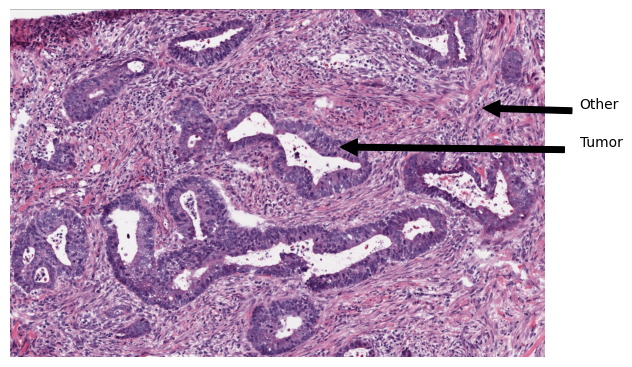

In [20]:
img_he = show_introduction_figure()


# Part 1 - Segmentation [16 pts]

## Part 1.1 - RGB (3 pts)

**Q1 (1 pts)**: In this section, you will have to complete the function `extract_rgb_channels`. The function should extract and return red, blue, and green channels from the input image `img`. Your function will be fed to `plot_colors_histo` to plot the distribution of the colors in the image. 

In [21]:
def extract_rgb_channels(img):
    """
    Extract RGB channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_red: np.ndarray (M, N)
        Red channel of input image
    data_green: np.ndarray (M, N)
        Green channel of input image
    data_blue: np.ndarray (M, N)
        Blue channel of input image
    """

    # Get the shape of the input image
    M, N, _ = np.shape(img)

    # Define default values for RGB channels
    data_red = np.zeros((M, N))
    data_green = np.zeros((M, N))
    data_blue = np.zeros((M, N))

    # Extract channels directly from the RGB tensor
    data_red = img[:, :, 0]
    data_green = img[:, :, 1]
    data_blue = img[:, :, 2]
    
    return data_red, data_green, data_blue

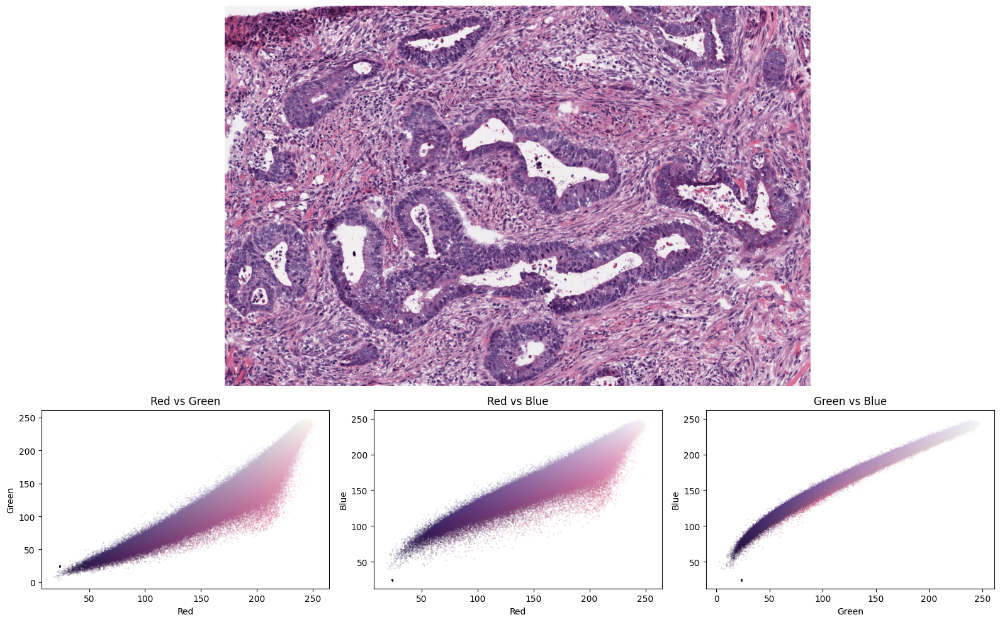

In [22]:
################################################################
############################ TEST ##############################
################################################################

plot_colors_histo(
    img = img_he,
    func = extract_rgb_channels,
    labels = ["Red", "Green", "Blue"],
)

Based on the result of the plot above

* **Q2 (1 pts)**: Do you think you can find a simple manual thresholding approach to isolate the tumor components? (Justify)
    * **Answer**: A simple threshold is possible and isolates part of the tumor because tumor regions are generally darker and more blue/purple than surrounding tissue. However, the RGB channel distributions overlap with non-tumor nuclei and stromal structures, so a single manual rule is only a rough approximation.
* **Q3 (1 pts)**: Implement your own manual thresholding in `apply_rgb_threshold` to estimate the tumor location. Use the function `plot_thresholded_image` below to display your estimation results. Do you think your estimation is reliable? (justify)
    * **Answer**: The RGB threshold gives a usable first estimate, but reliability is moderate at best. It is sensitive to local staining/intensity variation and tends to produce both false positives (other purple nuclei) and false negatives (lighter tumor parts).

In [23]:
def apply_rgb_threshold(img):
    """
    Apply threshold to input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract RGB channels
    data_red, data_green, data_blue = extract_rgb_channels(img=img)
    
    # Purple tumor regions: blue-dominant, moderate red, lower green
    mask = (
        (data_red > 70)
        & (data_green < 150)
        & (data_blue > 85)
        & (data_blue > data_green + 10)
    )
    img_th = mask
    
    return  img_th

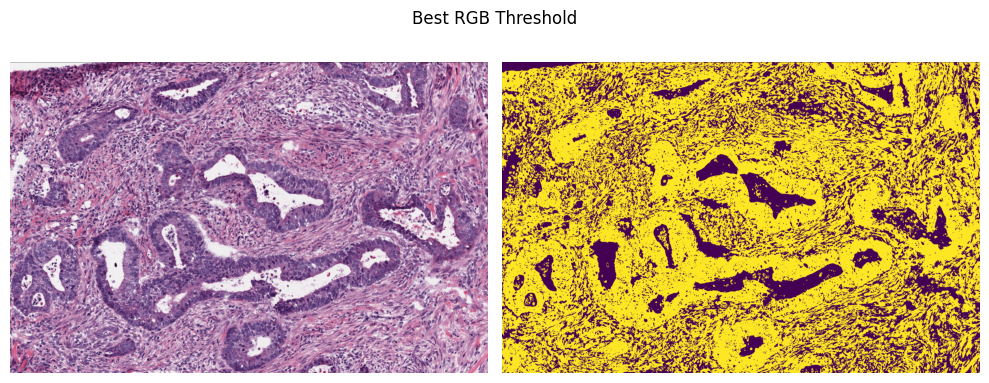

In [24]:
################################################################
############################ TEST ##############################
################################################################

# Plot best RGB thresholding
plot_thresholded_image(img=img_he, func=apply_rgb_threshold, title="Best RGB Threshold")

## Part 1.2 - Other colorspaces (3 pts)

So far we used the standard RGB colorspace to apply our thresholding. In this section, you will convert the image to a different color space. 

* **Q1 (1 pts)**: Use the function `rgb2hsv` from the skimage package ([see doc](https://scikit-image.org/docs/stable/auto_examples/color_exposure/plot_rgb_to_hsv.html)) to convert the input image from RGB to HSV in function `extract_hsv_channels`.
* **Q2 (1 pts)**: Can you see any difference between the use of the RGB or HSV space? (justify)
    * **Answer**: Yes. HSV separates chromatic information (Hue/Saturation) from brightness (Value), which makes purple tumor components easier to isolate than in RGB. In RGB, intensity changes affect all three channels simultaneously; in HSV, hue remains more stable under illumination changes, giving cleaner color-based thresholds.

In [25]:
def extract_hsv_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # Define default values for HSV channels
    data_h = np.zeros((M, N))
    data_s = np.zeros((M, N))
    data_v = np.zeros((M, N))

    # Convert from RGB to HSV and split channels
    img_hsv = rgb2hsv(img)
    data_h = img_hsv[:, :, 0]
    data_s = img_hsv[:, :, 1]
    data_v = img_hsv[:, :, 2]
    
    return data_h, data_s, data_v

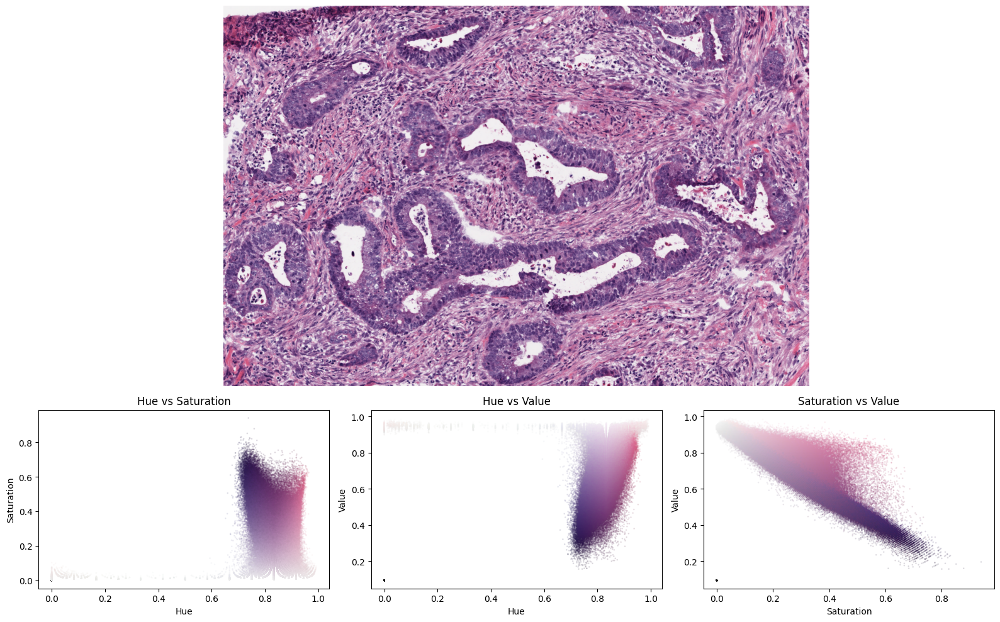

In [26]:
################################################################
############################ TEST ##############################
################################################################

# Call plotting function with your implemented function
plot_colors_histo(
    img = img_he,
    func = extract_hsv_channels,
    labels = ["Hue", "Saturation", "Value"],
)

* **Q3 (1 pts)**: Based on your results, try again to find the best manual threshold in function `apply_hsv_threshold`. Do you think your estimation is reliable? (justify)
    * **Answer**: The HSV threshold is more reliable than RGB thresholding because it focuses on hue and saturation of purple tissue while being less sensitive to intensity. Still, it remains imperfect: some non-tumor dark/purple structures are included and some heterogeneous tumor regions are missed, so post-processing is needed.

In [27]:
def apply_hsv_threshold(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract HSV channels
    data_h, data_s, data_v = extract_hsv_channels(img=img)
    
    # Tumor nuclei are mainly purple/blue with enough saturation
    mask = (
        (data_h > 0.62)
        & (data_h < 0.95)
        & (data_s > 0.18)
        & (data_v < 0.9)
    )
    img_th = mask
    
    return  img_th

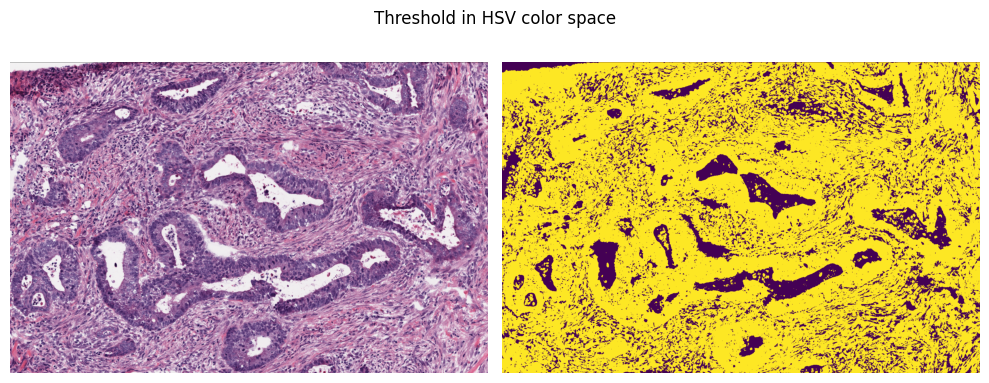

In [28]:
################################################################
############################ TEST ##############################
################################################################

# Find threshold(s) in the hsv channels
img_th=apply_hsv_threshold(img_he)
plot_thresholded_image(img=img_he, func=apply_hsv_threshold, title="Threshold in HSV color space")

## Part 1.3 - Morphology (5 pts)

To proceed, we will use your results from the previous thresholding (namely `apply_hsv_threshold`) as the starting point. In this exercise, we will try to clean the masked images using morphology to get a better estimation of the tumor area.

* **Q1 (1 pts)**: Implement the functions `apply_closing` and `apply_opening` with operations `closing` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing)), `opening` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening)) using the disk sizes arguments ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk)).
* **Q2 (1 pts)**: We test disk sizes: $1, 2, 5, 10$. Comment on the quality of the results.
    * **Answer**: Small disks (1, 2) only provide slight denoising and keep many tiny artifacts. Medium disks (around 5) usually give the best compromise by connecting fragmented tumor regions while preserving shape. Large disks (10) over-smooth the mask, merge separate structures, and can distort boundaries.

In [29]:
def apply_closing(img_th, disk_size):
    """
    Apply closing to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_closing: np.ndarray (M, N)
        Image after closing operation
    """

    # Define default value for output image
    img_closing = np.zeros_like(img_th)

    img_closing = closing(img_th.astype(bool), disk(disk_size))

    return img_closing


def apply_opening(img_th, disk_size):
    """
    Apply opening to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_opening: np.ndarray (M, N)
        Image after opening operation
    """

    # Define default value for output image
    img_opening = np.zeros_like(img_th)

    img_opening = opening(img_th.astype(bool), disk(disk_size))

    return img_opening


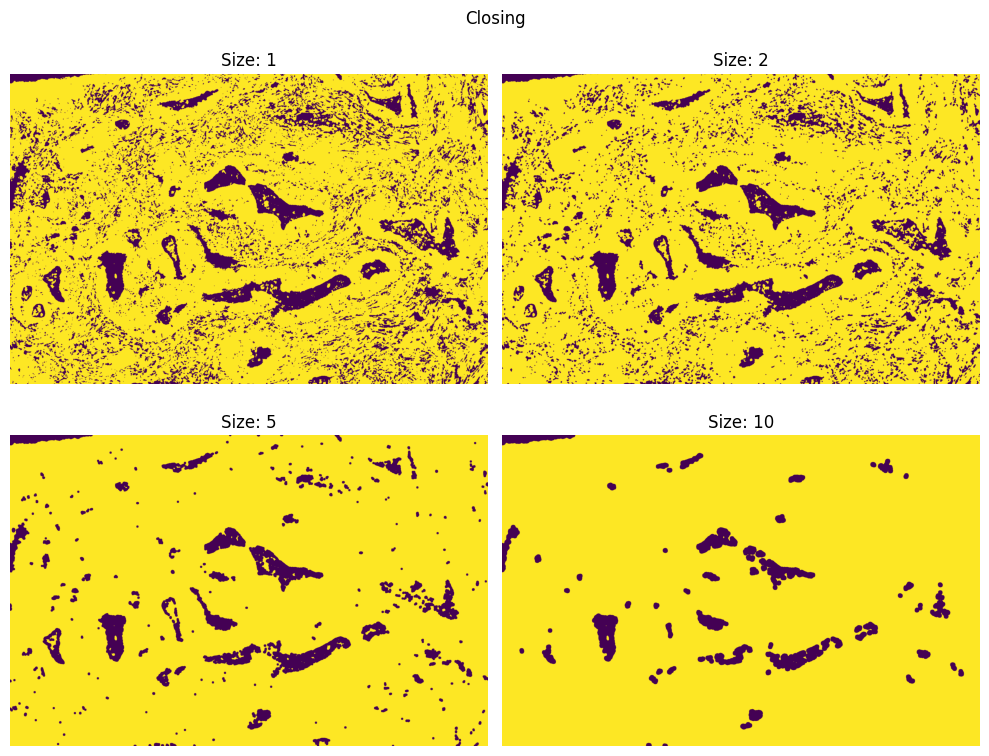

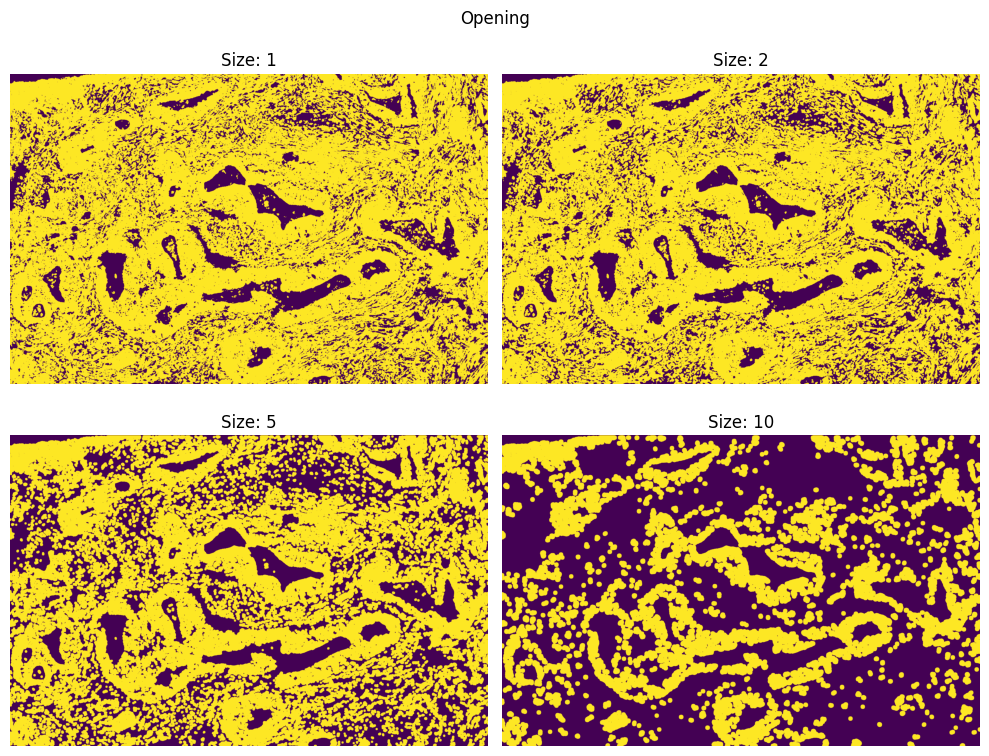

In [30]:
################################################################
############################ TEST ##############################
################################################################

plot_close_open(img_th, apply_closing, apply_opening)

* **Q3 (1 pts)** Implement the functions `remove_holes` and `remove_objects` using operations [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) from skimage package, respectively.
* **Q4 (1 pts)** We test the functions using area sizes: $10, 50, 100$, and $500$. Comment on the quality of the results.
    * **Answer**: Very small areas (10) have limited impact and leave much noise. Intermediate values (50-100) effectively clean speckle artifacts while preserving meaningful structures. A very large value (500) is often too aggressive: it removes useful small tumor components and can over-regularize the mask.

In [31]:
def remove_holes(img_th, size):
    """
    Remove holes from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of holes

    Return
    ------
    img_holes: np.ndarray (M, N)
        Image after remove holes operation
    """

    # Define default value for input image
    img_holes = np.zeros_like(img_th)

    img_holes = remove_small_holes(img_th.astype(bool), area_threshold=size)

    return img_holes


def remove_objects(img_th, size):
    """
    Remove objects from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of objects

    Return
    ------
    img_obj: np.ndarray (M, N)
        Image after remove small objects operation
    """

    # Define default value for input image
    img_obj = np.zeros_like(img_th)

    img_obj = remove_small_objects(img_th.astype(bool), min_size=size)

    return img_obj


C:\Users\doria\AppData\Local\Temp\ipykernel_27660\3495322538.py:21: FutureWarning: Parameter `area_threshold` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_holes`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_holes = remove_small_holes(img_th.astype(bool), area_threshold=size)
C:\Users\doria\AppData\Local\Temp\ipykernel_27660\3495322538.py:46: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_obj =

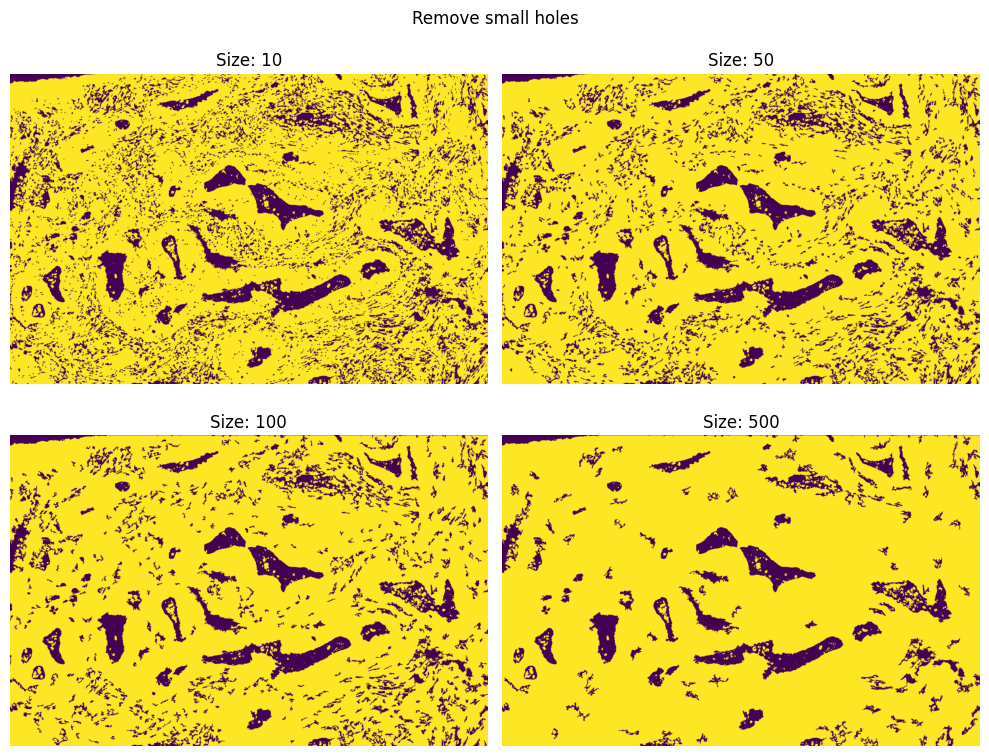

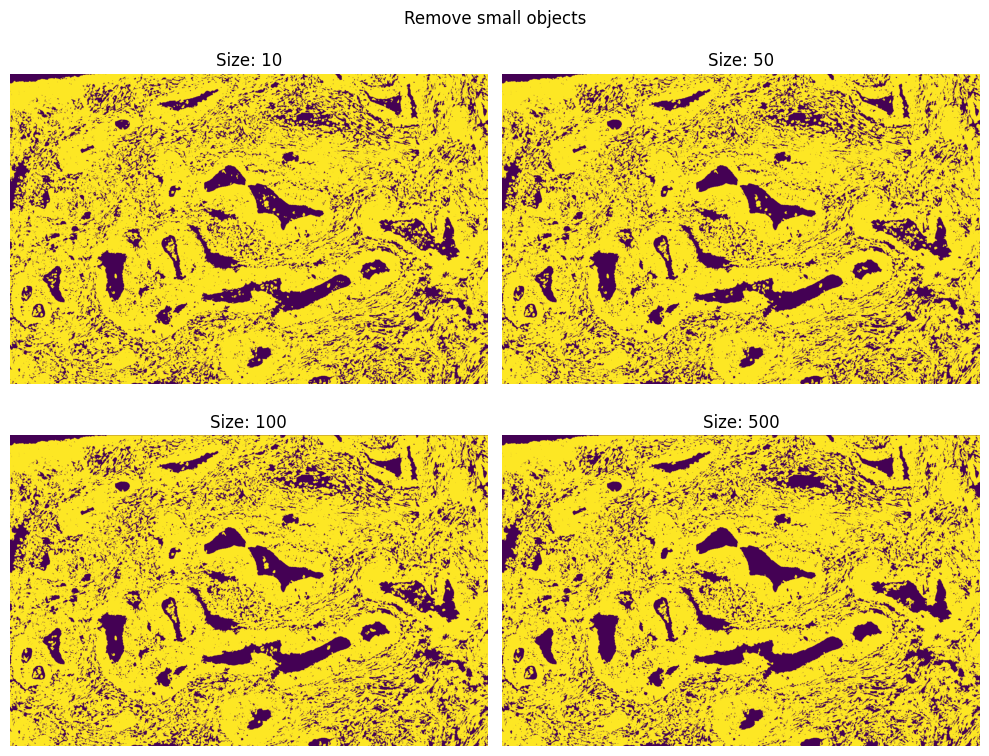

In [32]:
################################################################
############################ TEST ##############################
################################################################

plot_remove_holes_objects(img_th, remove_holes, remove_objects)

* **Q5 (1 pts)** Based on your previous results, implement the function `apply_morphology` that combines morphology functions to improve your tumor detection results from HSV thresholding. In this exercise, we prioritize having a higher number of false positives rather than false negatives, as mistakenly labeling non-tumor regions as tumors (over-segmentation) is preferable to missing actual tumor regions, which could lead to undetected cancerous areas and delayed treatment.

In [33]:
def apply_morphology(img_th):
    """
    Apply morphology to thresholded image

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.

    Return
    ------
    img_morph: np.ndarray (M, N)
        Image after morphological operations
    """

    img_morph = np.zeros_like(img_th)
    
    # Keep an over-segmented mask: fill gaps, keep small bridges, then expand slightly
    img_morph = apply_closing(img_th, disk_size=3)
    img_morph = remove_holes(img_morph, size=200)
    img_morph = remove_objects(img_morph, size=80)
    img_morph = binary_dilation(img_morph, disk(1))
    
    return img_morph

C:\Users\doria\AppData\Local\Temp\ipykernel_27660\3495322538.py:21: FutureWarning: Parameter `area_threshold` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_holes`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_holes = remove_small_holes(img_th.astype(bool), area_threshold=size)
C:\Users\doria\AppData\Local\Temp\ipykernel_27660\3495322538.py:46: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_obj =

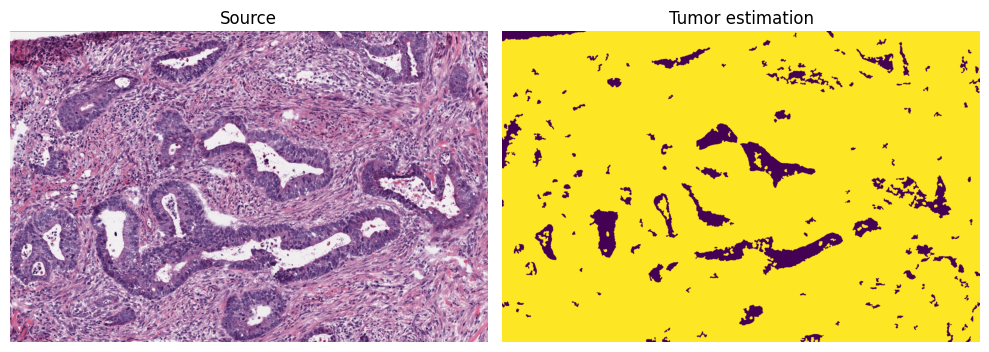

In [34]:
################################################################
############################ TEST ##############################
################################################################

img_best_morpho = apply_morphology(apply_hsv_threshold(img_he))
plot_morphology_best(
    img_source=img_he,
    img_best=img_best_morpho,
)

## Part 1.4 - Region Growing (4 pts)

* **Q1 (3 pts)** In this section we ask you to implement from scratch your own `region_growing` function to detect the tumor area. The function should take as input an RGB image, seeds that are manual initialization points in the tumor area, and the maximum number of iterations to perform. ote that the function also includes the kwargs argument. You can use it to add additional parameters to your function if needed (see [doc kwargs](https://book.pythontips.com/en/latest/args_and_kwargs.html)). Importantly, for timing reasons, a single explicit for loop on iterations is expected. An explicit for loop on pixels or neighbours will be accepted but penalised by 1 point. Use numpy tools to succeed.
* **Q2 (1 pts)** Your function is then used to perform region growing using multiple iterations. Comment on the quality of the results based on the number of iterations performed as well as the running time.
    * **Answer**: With few iterations, growth remains close to seeds and under-segments the tumor. As iterations increase, coverage improves and contiguous tumor areas are recovered; however, very high iterations can start leaking into neighboring tissue if color constraints are permissive. Runtime increases with iteration count and region size, but remains reasonable thanks to vectorized operations.

In [35]:
def region_growing(
    seeds: list[tuple],
    img: np.ndarray,
    n_max: int = 10,
    **kwargs
):
    """
    Run region growing on input image using seed points.

    Args
    ----
    seeds: list of tuple
        List of seed points
    img: np.ndarray (M, N, C)
        RGB image of size M, N, C
    n_max: int
        Number maximum of iterations before stopping algorithm

    Return
    ------
    rg: np.ndarray (M, N)
        Image after region growing has been performed
    """
    
    M, N, _ = img.shape
    rg = np.zeros((M, N)).astype(bool)
    
    # Optional parameters to tune acceptance
    color_tol = kwargs.get("color_tol", 45.0)
    sat_min = kwargs.get("sat_min", 0.15)

    # Initialize region from seeds
    for r, c in seeds:
        if 0 <= r < M and 0 <= c < N:
            rg[r, c] = True

    # Use HSV saturation to avoid flooding pale tissue/background
    h, s, v = extract_hsv_channels(img)
    sat_mask = s >= sat_min

    img_float = img.astype(np.float32)
    if np.any(rg):
        region_mean = img_float[rg].mean(axis=0)
    else:
        return rg

    for _ in range(n_max):
        frontier = binary_dilation(rg) & (~rg)
        if not np.any(frontier):
            break

        color_dist = np.linalg.norm(img_float - region_mean[None, None, :], axis=2)
        accepted = frontier & sat_mask & (color_dist <= color_tol)
        if not np.any(accepted):
            break

        rg = rg | accepted
        region_mean = img_float[rg].mean(axis=0)
                    
    return rg

In [36]:
# Add you additional arguments in the dictionary below
kwargs = {
    "color_tol": 42.0,
    "sat_min": 0.16,
}

C:\Users\doria\AppData\Local\Temp\ipykernel_27660\626098078.py:48: FutureWarning: `binary_dilation` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.dilation` instead. Note the lack of mirroring for non-symmetric footprints (see docstring notes).
  frontier = binary_dilation(rg) & (~rg)


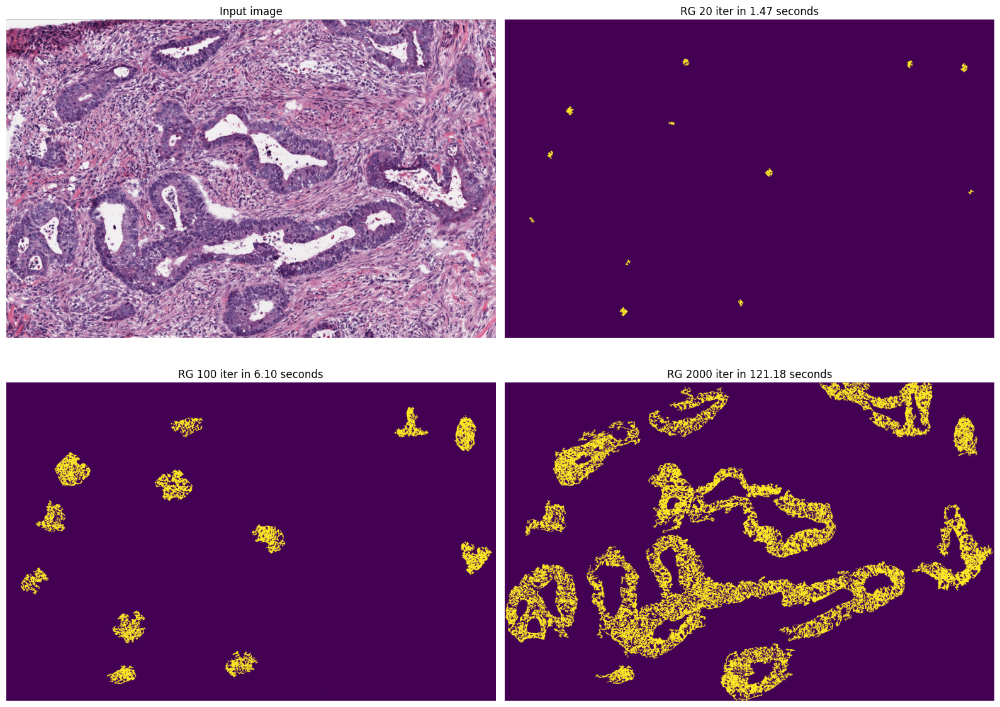

In [37]:
################################################################
############################ TEST ##############################
################################################################

img_grow = plot_tumor_region_growing(img_he, region_growing, **kwargs)

## Part 1.5 - Final Comparison (1 pts)

* **Q1 (1 pts)** Run the cell below. Based on your observation, which approach do you think gives the best estimation of the tumor area? (justify)
    * **Answer**: The best overall compromise is HSV thresholding followed by morphology. It is more stable than RGB thresholding and less seed-dependent than region growing, while morphological post-processing removes isolated artifacts and improves spatial coherence. Region growing can be competitive but is more sensitive to seed placement and stopping parameters.

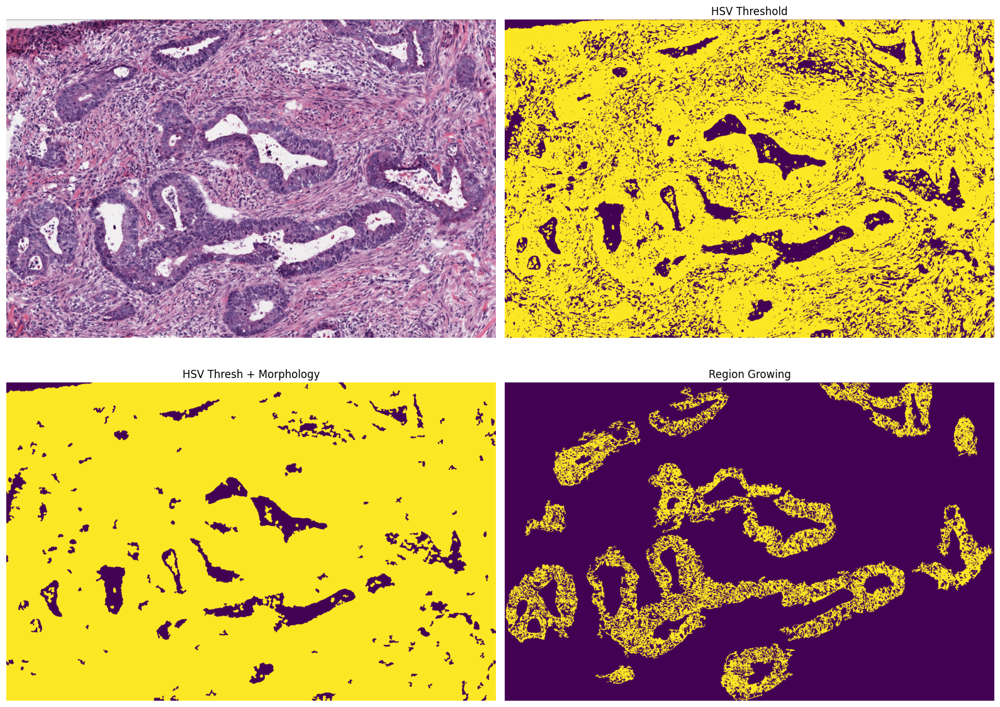

In [38]:
################################################################
############################ TEST ##############################
################################################################

plot_final_comparison(img_he, img_th, img_best_morpho, img_grow)

---
# Part 2 - Sandbox [8 pts]

For the second part, you will work on a new HE case without help. This time we ask you to
* **Q1 (4 pts)**: detect and compute the area of the blood cells,
* **Q2 (4 pts)**: detect and compute the area of the mucin.

**Mucin**: Grayish mucus that is secreted by the body. The presence of a tumor tends to increase its presence.

Provide your results to the function `plot_results`. See the example below. Be careful, the completely white area is not mucin. It is the slide background and should be discarded. Moreover, you can focus on the large blood cell aggregates (large red areas)

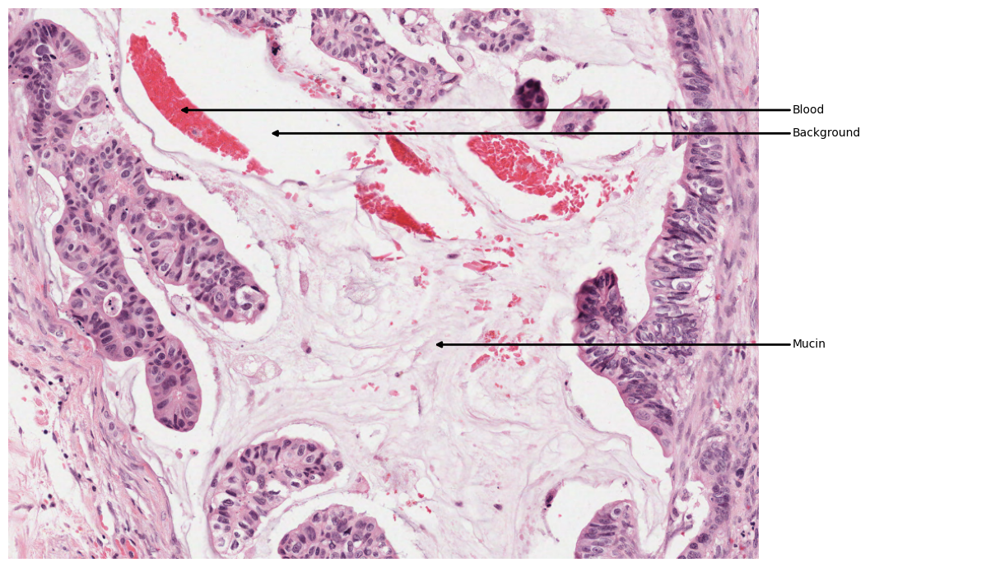

In [39]:
img_he2 = show_exo2_figure()

In [40]:
M, N, C = np.shape(img_he2)
mask_blood = np.zeros((M, N))
mask_mucin = np.zeros((M, N))

img2_hsv = rgb2hsv(img_he2)
h2 = img2_hsv[:, :, 0]
s2 = img2_hsv[:, :, 1]
v2 = img2_hsv[:, :, 2]

# Blood: red hue, high saturation (focus on large aggregates)
mask_blood = (((h2 < 0.06) | (h2 > 0.95)) & (s2 > 0.45) & (v2 > 0.15) & (v2 < 0.95))
mask_blood = remove_small_objects(mask_blood.astype(bool), min_size=350)
mask_blood = closing(mask_blood, disk(3))

# Mucin: low saturation gray tissue, exclude bright white background
mask_mucin = ((s2 < 0.18) & (v2 > 0.35) & (v2 < 0.92))
mask_mucin = remove_small_objects(mask_mucin.astype(bool), min_size=600)
mask_mucin = remove_small_holes(mask_mucin, area_threshold=300)

C:\Users\doria\AppData\Local\Temp\ipykernel_27660\844281884.py:12: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  mask_blood = remove_small_objects(mask_blood.astype(bool), min_size=350)
C:\Users\doria\AppData\Local\Temp\ipykernel_27660\844281884.py:17: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  mask_mucin = re

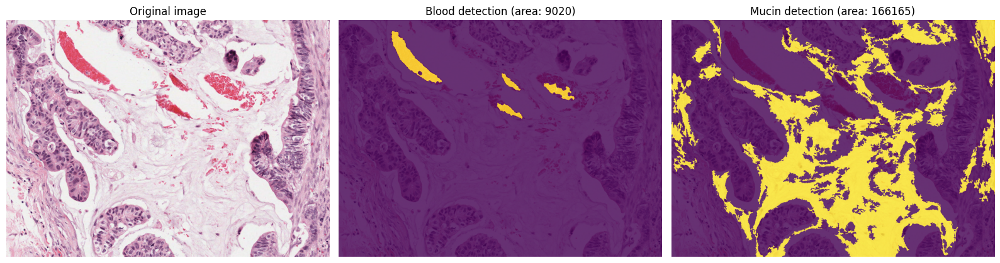

In [41]:
################################################################
############################ TEST ##############################
################################################################

plot_results(img=img_he2, mask_blood=mask_blood, mask_mucin=mask_mucin)